# OpenCV Library


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing and transmitting, and gathering images through the internet.
Python is an excellent choice as it has many image processing tools, computer vision, and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and the internet.
A digital image is simply a file on your computer. In this lab, you will gain an understanding  of these files and learn to work with these files with some popular libraries


<ul>
    <li><a href='#PIL'>Open CV </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
        </ul>
    </li>
    
</ul>


----


Download the image for the lab:


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png

--2026-01-09 07:08:27--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘lenna.png’

lenna.png           100%[===================>] 462.73K  --.-KB/s    in 0.1s    

2026-01-09 07:08:27 (4.69 MB/s) - ‘lenna.png’ saved [473831/473831]

--2026-01-09 07:08:27--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-cours

1. Tải 3 file ảnh PNG từ Internet về thư mục làm việc hiện tại bằng lệnh wget trong Jupyter/Colab.

First, let's define a helper function to concatenate two images side-by-side. You will need to understand this code this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [5]:
from tkinter import Image
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

2) Hàm get_concat_h này có tác dụng ghép hai bức ảnh lại với nhau theo chiều ngang (Horizontal). Tức là ảnh im2 sẽ được nối tiếp ngay bên phải của ảnh im1.


## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [6]:
my_image = "lenna.png"

3. Gắn biến my_image với file lenna.png

Filename consists of two parts, the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the image. There are two popular image formats -- Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image using sine/cosine approximations, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory.


In [7]:
import os
cwd = os.getcwd()
cwd

'/content'

4. import thư viên os và hiển thị thư mục chưa file

The "path" to an image can be found using the following line of code.


In [36]:
import os

cwd = "/content"
filename = "lenna.png"
image_path = os.path.join(cwd, filename)
print(image_path)

/content/lenna.png


5. Gán đường dẫn thư mục là /content cho biến image_path

## Load in Image in Python


OpenCV is a library used for computer vision. It has more functionality than the `PIL` library but is more difficult to use. We can import `OpenCV` as follows:


In [37]:
import cv2

6. Thêm vào thư viên opencv

The <code>imread()</code> method loads an image from the specified file, the input is the <code>path</code> of the image to be read (just like PIL), the <code>flag</code> paramter specifies how the image should be read, and the default value is <code>cv2.IMREAD_COLOR</code>.


In [38]:
image = cv2.imread(my_image)

7. Tải một hình ảnh từ tệp được chỉ định

The result is a numpy array with intensity values as 8-bit unsigned integers.


In [39]:
type(image)

numpy.ndarray

8. Kết quả của đoạn code trên là một mảng

We can get the shape of the array from the `shape` attribute.


In [40]:
image.shape

(512, 512, 3)

9. Có tác dụng trả về kích thước và cấu trúc của bức ảnh dưới dạng một bộ 3 số

The shape is the same as the PIL array, but there are several differences; for example, PIL returns in (R, G, B) format whereas OpenCV returns in (B, G, R) format.


Each pixel could take on 256 possible values as intensity, ranging from 0 to 255, with 0 being the lowest intensity and 255 being the highest. The maximum and minimum intensity values of an image can be obtained, respectively, by calling:


In [41]:
image.max()

np.uint8(255)

and


In [42]:
image.min()

np.uint8(3)

10. Hai lệnh image.max() và image.min() có tác dụng tìm ra giá trị pixel lớn nhất và nhỏ nhất trong toàn bộ bức ảnh.

##  Plotting an Image


You can use OpenCV's `imshow` function to open the image in a new window, but this may give you some issues in Jupyter:


In [30]:
#cv2.imshow('image', imgage)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

You can also use the `imshow` function from the `matplotlib` library:


In [43]:
import matplotlib.pyplot as plt

11. Thêm thư viên matplotlib.pyplot

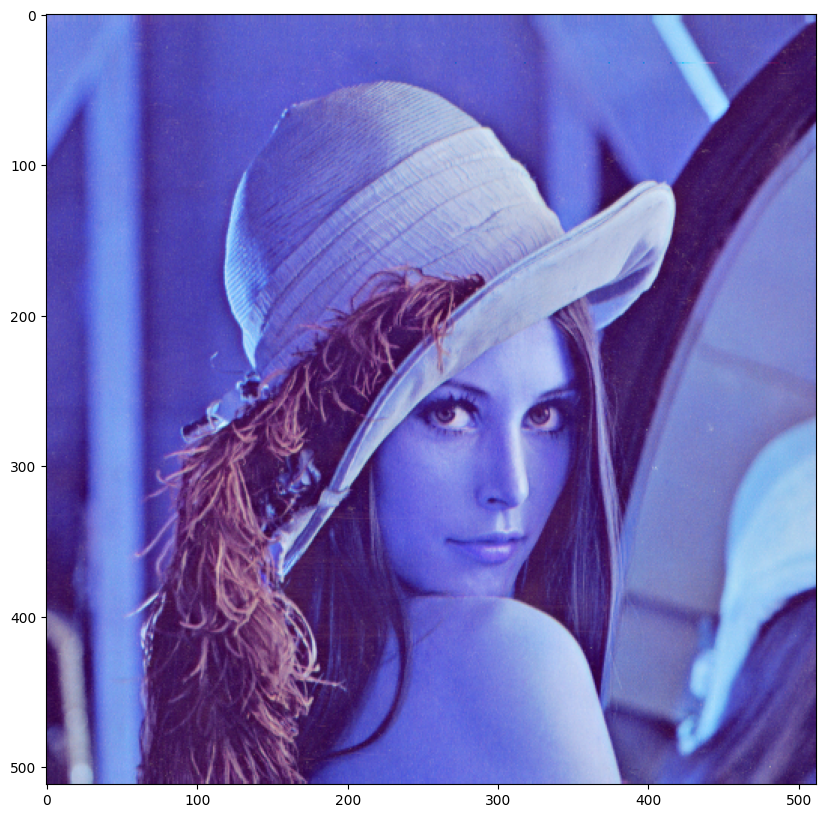

In [44]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

12. Hiển thị một bức ảnh lên màn hình với kích thước tùy chỉnh

The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function `cvtColor` from the `cv2` library:


In [45]:
new_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

13. Thay đổi màu của ảnh

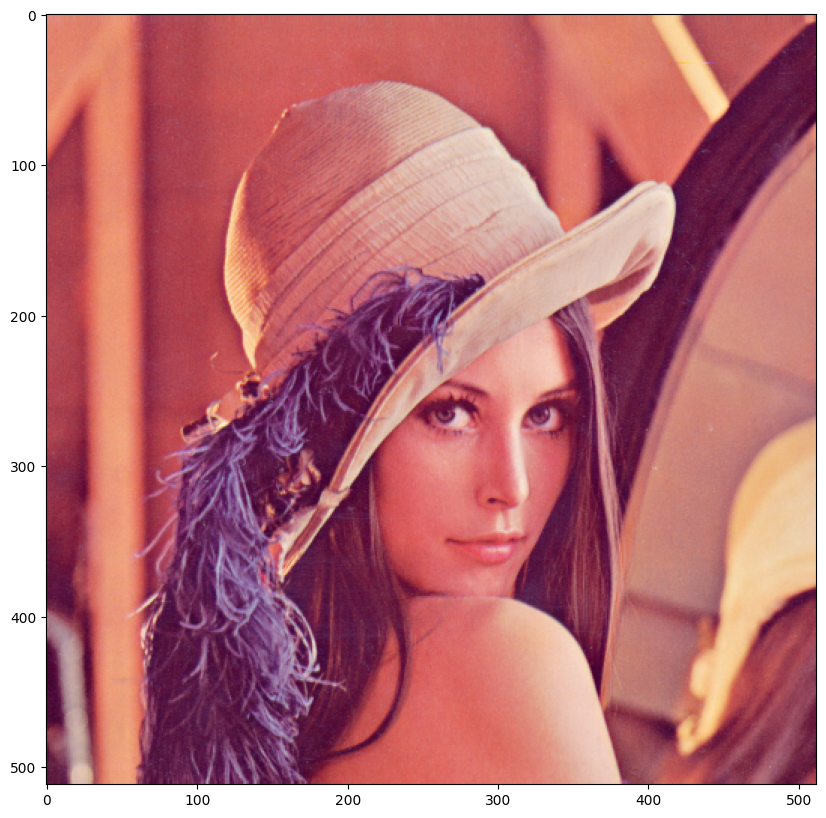

In [46]:
plt.figure(figsize=(10,10))
plt.imshow(new_image)
plt.show()

14.Hiển thị một bức ảnh lên màn hình với kích thước tùy chỉnh

You can also load the image using its path, this comes in handy if the image is not in your working directory:


In [47]:
image = cv2.imread(image_path)
image.shape

(512, 512, 3)

15. Tải hình ảnh bằng đường dẫn của nó

You can save the image as in `jpg` format.


In [48]:
cv2.imwrite("lenna.jpg", image)

True

16. Lưu ảnh bằng file đuôi .jpg

### Grayscale Images


Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function <code>cvtColor</code>.


The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


In [49]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

17. Đổi ảnh thành màu đen trắng

The image array has only two dimensions, i.e. only one color channel:


In [50]:
image_gray.shape

(512, 512)

18. Giờ đây ảnh chỉ còn màu đen trắng không còn giá trị 3 ở cuối nữa

We can plot the image using `imshow` but we have to specify the color map is gray:


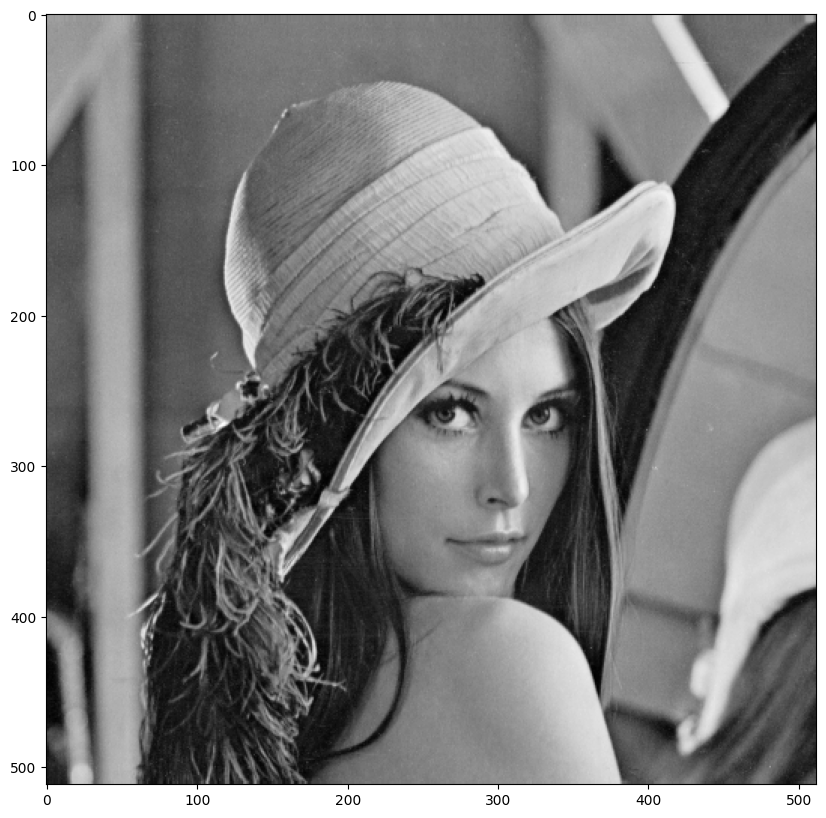

In [51]:
plt.figure(figsize=(10, 10))
plt.imshow(image_gray, cmap='gray')
plt.show()

19. Hiển thị ảnh

We can save the image as a grayscale image, let's save it as a `jpg` as well, in the working directory.


In [52]:
cv2.imwrite('lena_gray_cv.jpg', image_gray)

True

20. Tải ảnh về với tên trên

You can also load in a grayscale image we have to set <code>flag</code> parameter to gray color conversation code: <code>cv2.COLOR_BGR2GRAY</code>:


In [53]:
im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE)

21. Tải ảnh xám bằng cách thiết lập tham số cờ thành mã chuyển đổi màu xám

We can plot the image:


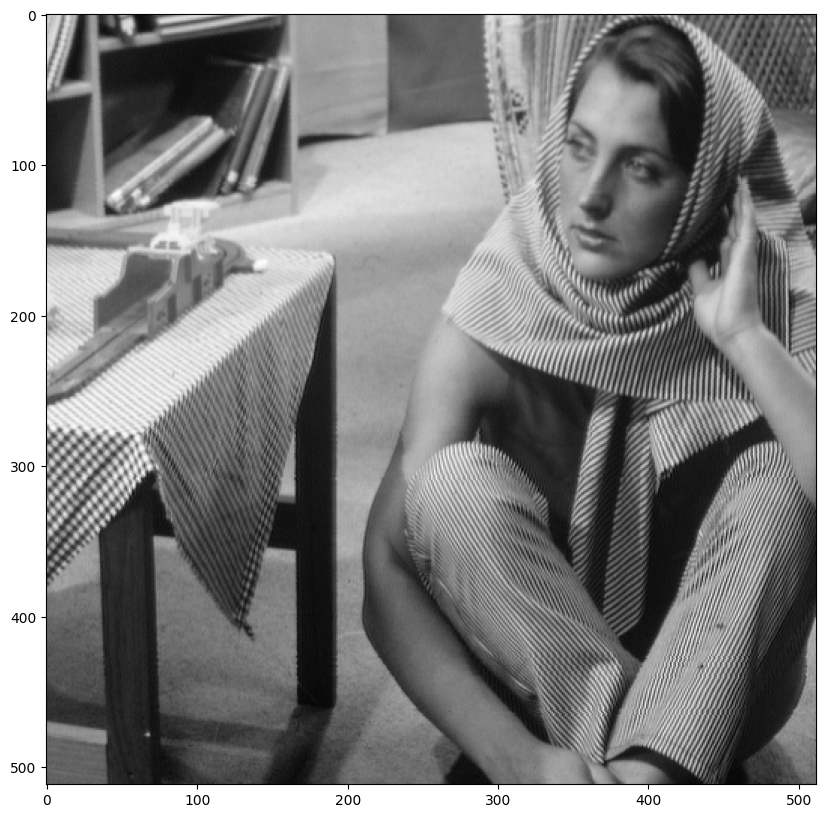

In [54]:
plt.figure(figsize=(10,10))
plt.imshow(im_gray,cmap='gray')
plt.show()

22. Hiển thị ảnh

### Color Channels  


We can also work with the different color channels. Consider the following image:


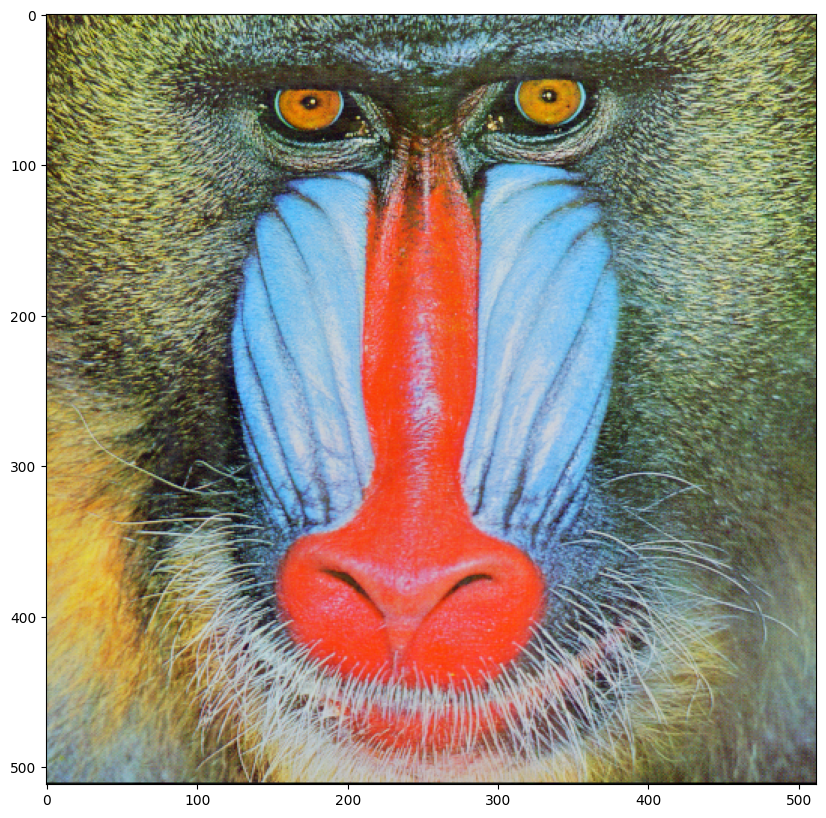

In [55]:
baboon=cv2.imread('baboon.png')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.show()

23. Bạn cũng có thể thay đổi màu của ảnh trên bằng đoạn code bên dưới

We can obtain the different RGB colors and assign them to the variables <code>blue</code>, <code>green</code>, and <code>red</code>, in (B, G, R) format.


In [56]:
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2]

24. Thay đổi màu sắc bằng cách thay đổi giá trị màu blue , green , red

We can concatenate each image channel the images using the function <code>vconcat</code>.


In [57]:
im_bgr = cv2.vconcat([blue, green, red])

25. Chúng ta có thể ghép các kênh hình ảnh lại với nhau bằng hàm vconcat

Plotting the color image next to the red channel in grayscale, we see that regions with red have higher intensity values.


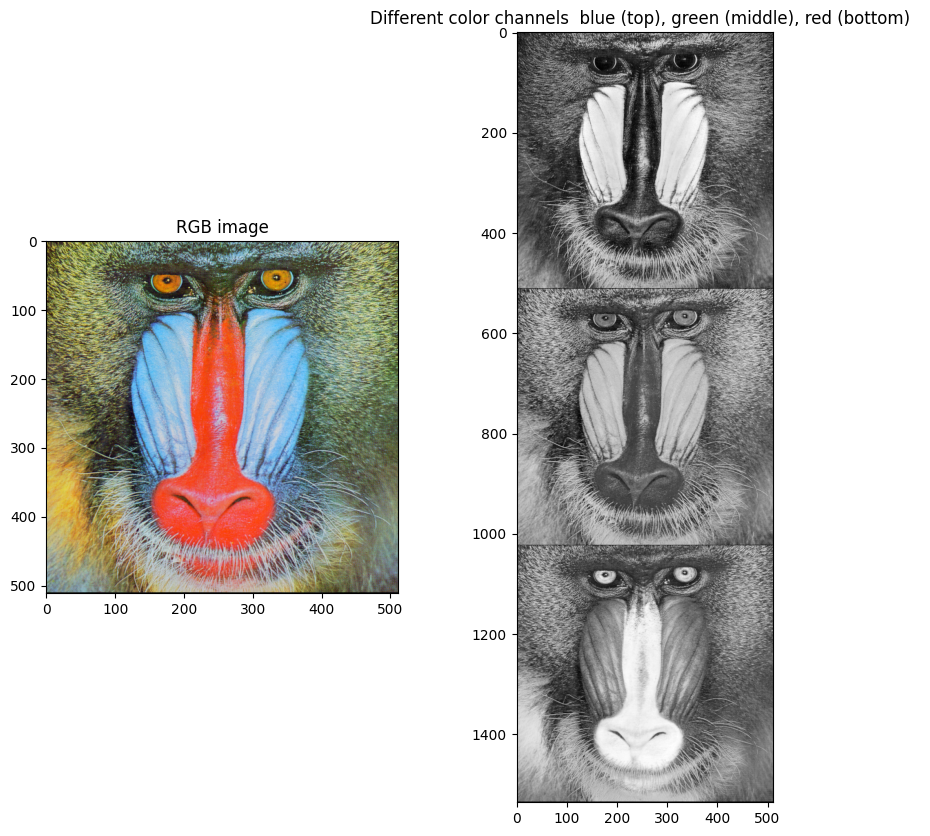

In [58]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("RGB image")
plt.subplot(122)
plt.imshow(im_bgr,cmap='gray')
plt.title("Different color channels  blue (top), green (middle), red (bottom)  ")
plt.show()

26. Hiển thị cac 1bức ảnh nằm cạnh nhau trên cùng một khung hình
Bên trái là ảnh gốc
Bên phải là các ảnh đen trắng đã đổi giá trị màu blue, red, green

### Indexing  


We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


In [59]:
rows = 256

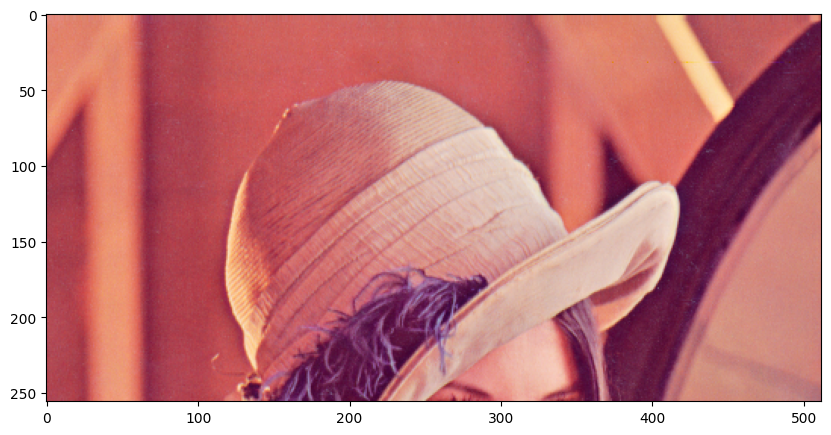

In [60]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[0:rows,:,:])
plt.show()

27. Giữ lại 256 pixel bên trái rồi hiển thị ảnh

We can also return the first 256 columns corresponding to the first half of the image:


In [61]:
columns = 256

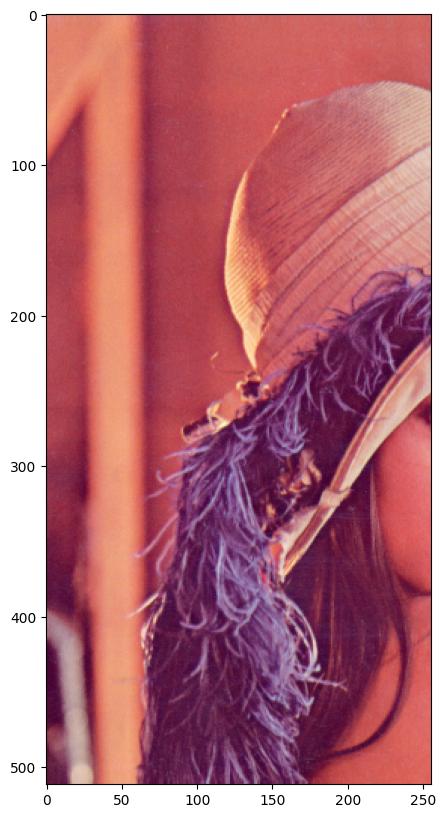

In [62]:
plt.figure(figsize=(10,10))
plt.imshow(new_image[:,0:columns,:])
plt.show()

28. Giữ lại 256 pixel bên trái rồi hiển thị ảnh

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


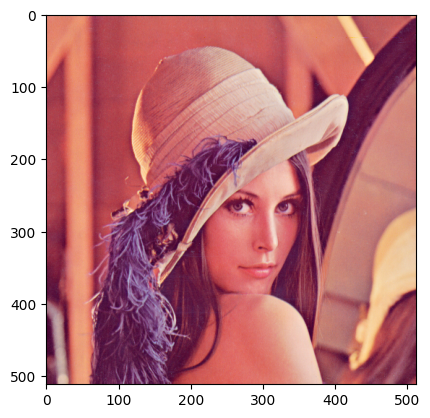

In [63]:
A = new_image.copy()
plt.imshow(A)
plt.show()

29. Gán lại một mảng cho một biến khác,nên sử dụng phương thức copy

If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the variable `B` below, if we set all values of array `A` to zero, since `A` and `B` points to the same object in the memory, `B` will also have all-zero elements:


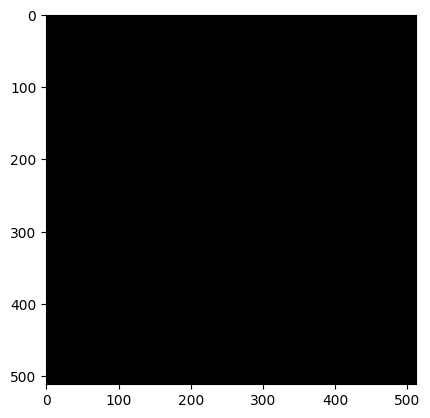

In [64]:
B = A
A[:,:,:] = 0
plt.imshow(B)
plt.show()

30. Nếu chúng ta không áp dụng phương thức copy(), biến sẽ trỏ đến cùng một vị trí trong bộ nhớ. Chúng ta đặt tất cả các phần tử của mảng A bằng 0, vì A và B cùng trỏ đến một đối tượng trong bộ nhớ, nên B cũng sẽ có tất cả các phần tử bằng 0

We can also manipulate elements using indexing. In the following piece of code, we create a new array `baboon_red` and set all but the red color channels to zero. Therefore, when we display the image, it appears red:


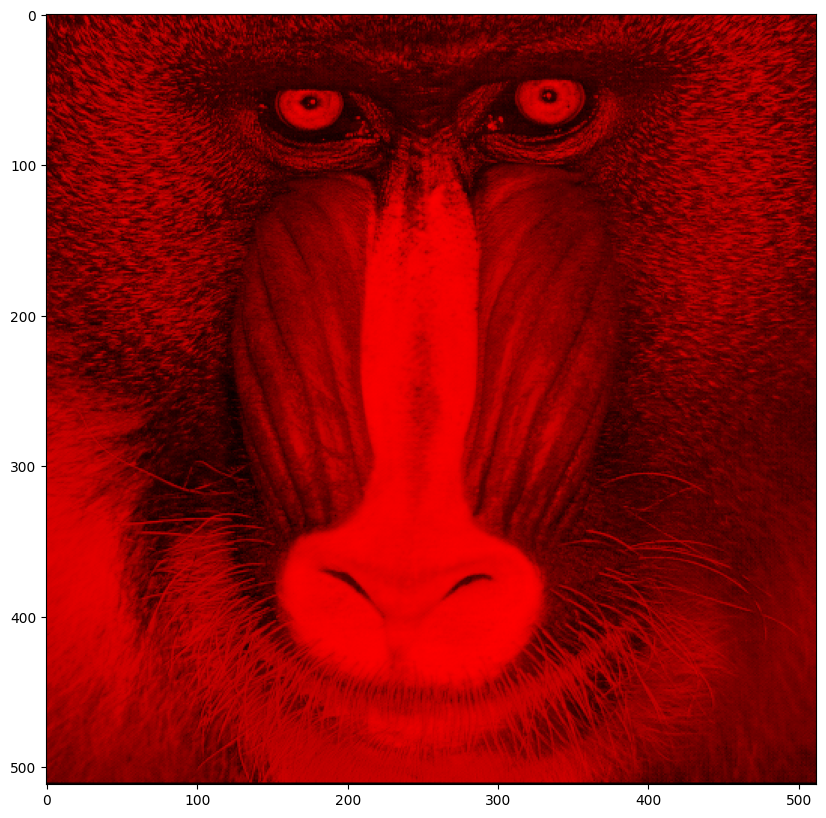

In [67]:
baboon_red = baboon.copy()
baboon_red[:, :, 0] = 0
baboon_red[:, :, 1] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB))
plt.show()

31. Đoạn code này có tác dụng lọc và chỉ giữ lại màu Đỏ (Red) của bức ảnh con khỉ (Baboon). Tất cả các màu khác (Xanh dương, Xanh lá) sẽ bị loại bỏ hoàn toàn. Sau đó hiển thị ảnh

We can do the same for blue:  


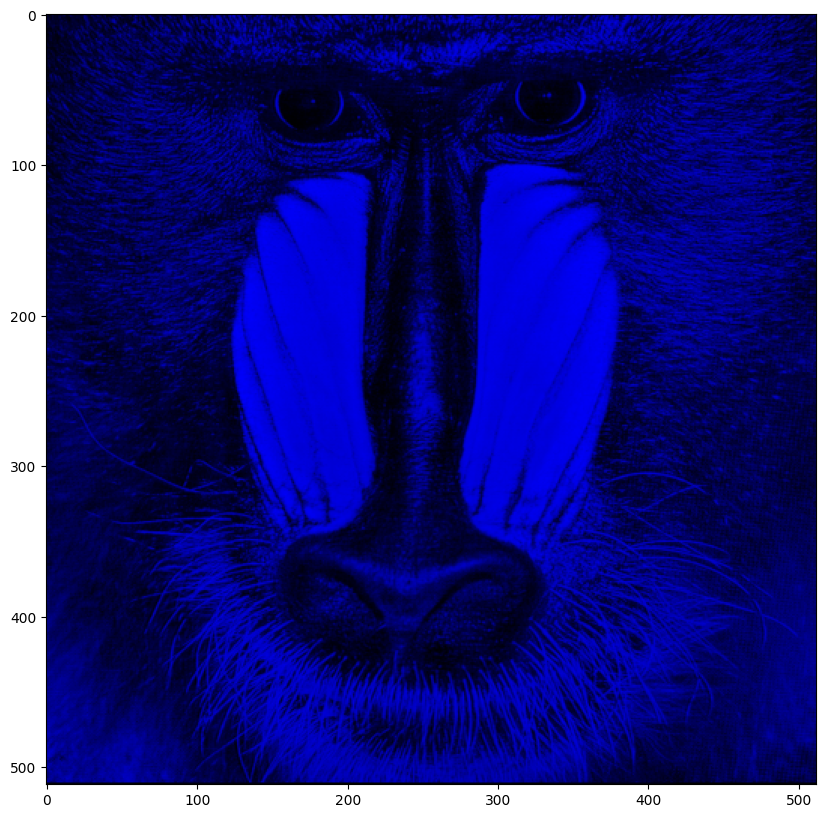

In [68]:
baboon_blue = baboon.copy()
baboon_blue[:, :, 1] = 0
baboon_blue[:, :, 2] = 0
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))
plt.show()

32. Tương tự như trên biến các giá trị khác ngoài màu blue thành 0

We can do the same for green:


In [ ]:
baboon_green = baboon.copy()
baboon_green[:, :, 0] = 0
baboon_green[:, :, 2] = 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB))
plt.show()

33. Tương tự như trên biến các giá trị khác ngoài màu green thành 0

In [69]:
image=cv2.imread('baboon.png')

34. Đọc và tải ảnh baboon.png

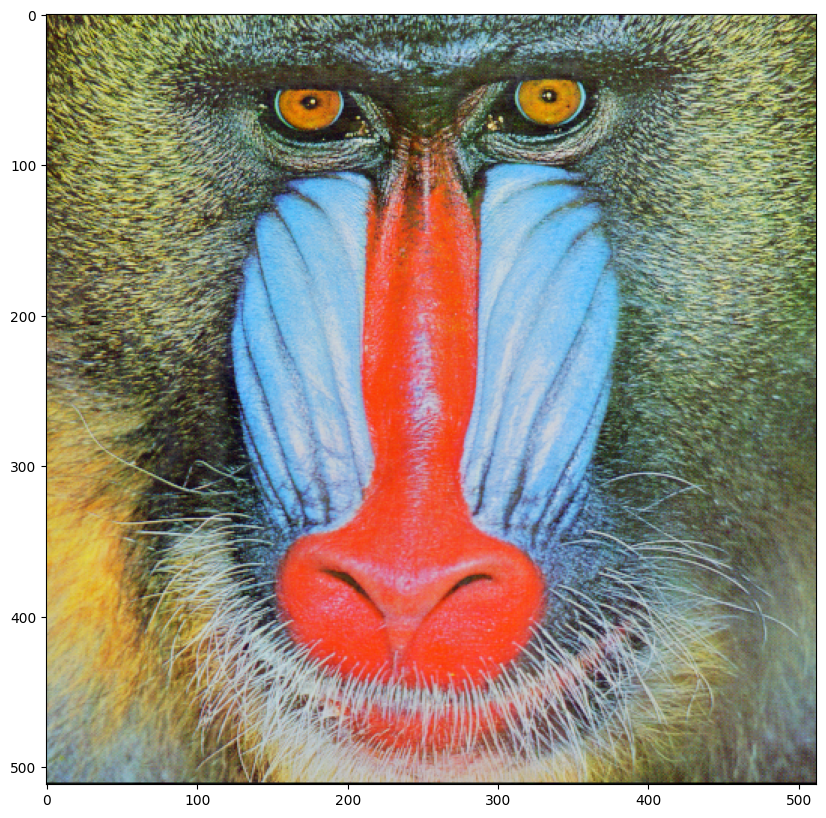

In [70]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

35.Hiển thị ảnh baboon.png

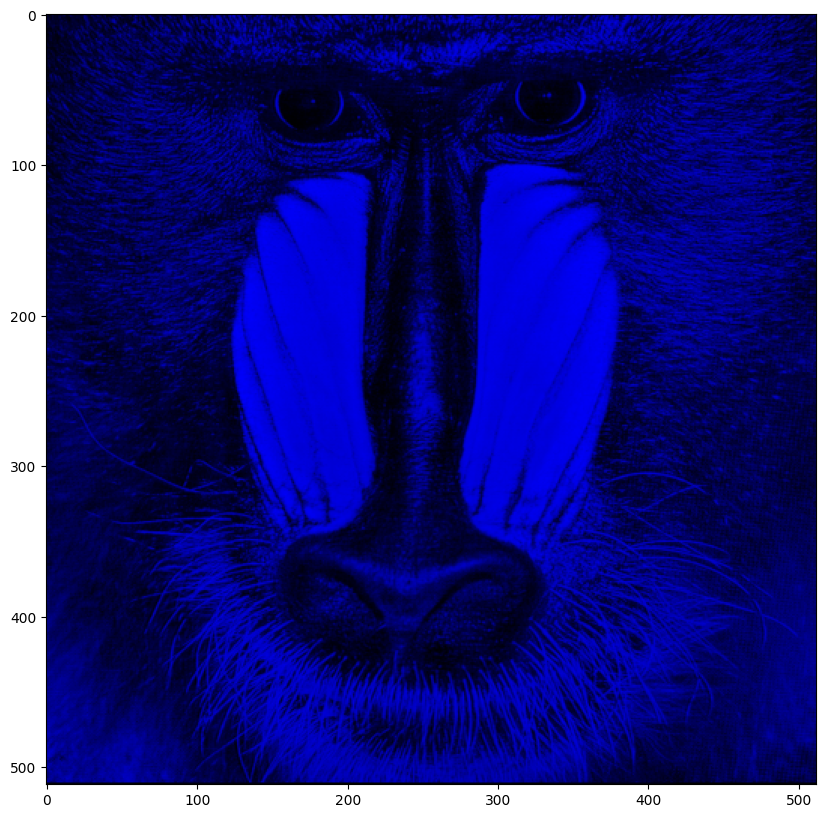

In [71]:
image=cv2.imread('baboon.png') # replace and add you image here name
baboon_blue=image.copy()
baboon_blue[:,:,1] = 0
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB))
plt.show()

36. Biến ảnh trên thành màu blue xong sau đó hiển thị ảnh

### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a OpenCV Image object called `baboon_blue`, convert the image from BGR format to RGB format, get the blue channel out of it, and finally plot the image


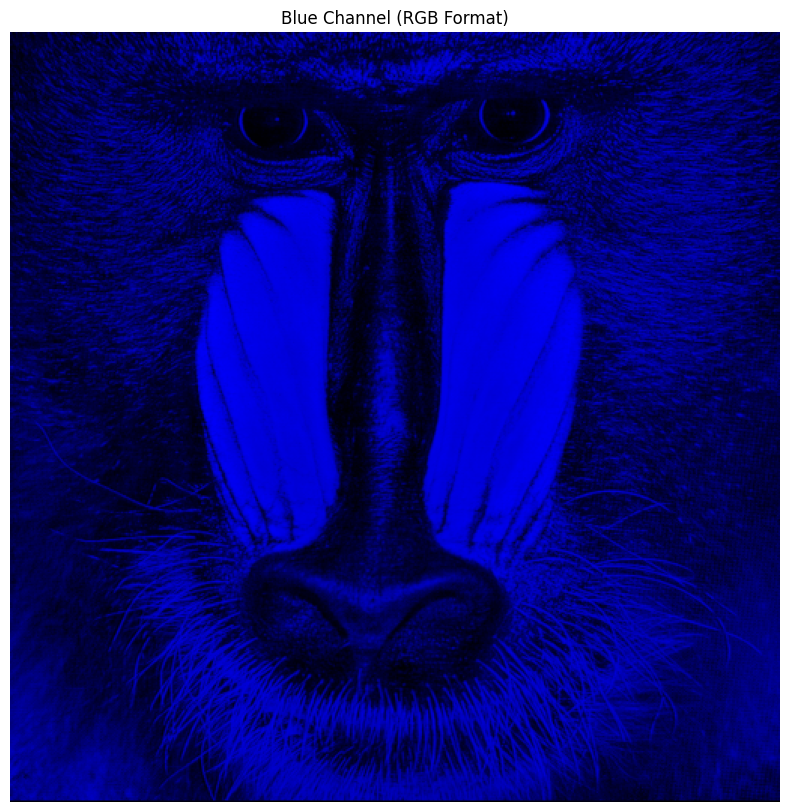

In [72]:
import cv2
import matplotlib.pyplot as plt

baboon = cv2.imread('baboon.png')

baboon_rgb = cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)

baboon_blue = baboon_rgb.copy()

baboon_blue[:, :, 0] = 0  # Xóa màu Đỏ (Red)
baboon_blue[:, :, 1] = 0  # Xóa màu Xanh lá (Green)

# 5. Vẽ ảnh
plt.figure(figsize=(10, 10))
plt.imshow(baboon_blue)
plt.title("Blue Channel (RGB Format)")
plt.axis('off')
plt.show()


Double-click **here** for a hint.

<!-- The hint is below:

baboon_blue[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

baboon_blue=cv2.imread('baboon.png')
baboon_blue=cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

-->


# References


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


### So sánh thư viện PIL (Pillow) và OpenCV (CV)

**1. PIL (Pillow):**
- Thư viện xử lý ảnh cơ bản trong Python.
- Phù hợp cho người mới bắt đầu học xử lý ảnh.
- Dễ sử dụng, cú pháp đơn giản.
- Làm việc với đối tượng ảnh (Image object).
- Không gian màu mặc định là RGB.
- Thực hiện tốt các thao tác cơ bản như: mở ảnh, lưu ảnh, resize, crop, xoay ảnh.
- Tốc độ xử lý ở mức trung bình.
- Ít hỗ trợ các bài toán thị giác máy tính nâng cao.

**2. OpenCV (CV):**
- Thư viện mạnh cho xử lý ảnh và thị giác máy tính.
- Phù hợp cho các ứng dụng nâng cao và nghiên cứu.
- Cú pháp phức tạp hơn PIL.
- Làm việc trực tiếp với ma trận NumPy.
- Không gian màu mặc định là BGR.
- Xử lý nhanh, tối ưu cao, hỗ trợ thời gian thực.
- Hỗ trợ nhiều kỹ thuật nâng cao: nhận diện khuôn mặt, phát hiện vật thể, xử lý video, AI.
- Được sử dụng rộng rãi trong các hệ thống Computer Vision.
